# Level 1 Task 1: Data Exploration and Preprocessing

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [24]:
# reading the data
df = pd.read_csv("C:/Users/Rohit Gupta/Desktop/Cognify dataset.csv")

In [3]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [4]:
# Checking the number of rows and columns
print("Data Shape:", df.shape)  

Data Shape: (9551, 21)


#### The provided dataset contains 9551 rows and 21 columns

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

#### Checking missing values in each column

In [6]:
missing_values = df.isnull().sum()
print(missing_values)

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


#### The Cuisines column contains 9 null values

## Handling Null Values

#### I have decided to replace these null values with the not given in the given dataset

In [5]:
# Filling missing values in "cuisines" with the not given
df['Cuisines'].fillna("not given", inplace=True)

In [6]:
print(df['Cuisines'].isnull().sum())

0


In [7]:
print(df['Cuisines'])

0             French, Japanese, Desserts
1                               Japanese
2       Seafood, Asian, Filipino, Indian
3                        Japanese, Sushi
4                       Japanese, Korean
                      ...               
9546                             Turkish
9547     World Cuisine, Patisserie, Cafe
9548              Italian, World Cuisine
9549                     Restaurant Cafe
9550                                Cafe
Name: Cuisines, Length: 9551, dtype: object


#### Removing duplicates from dataset (if any present)

In [8]:
df = df.drop_duplicates()

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9551 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

#### As even after dropping duplicates in the dataset, my dataset still contains 9551 rows and 21 columns same as before dropping the duplicates. This means that my dataset contains no duplicates.

### Analyze the distribution of the target variable ("Aggregate rating")

In [10]:
target_variable = df["Aggregate rating"]

# Analyzing the distribution by counting the occurences of each rating in the target variable
print(target_variable.value_counts())
print(target_variable.describe())

Aggregate rating
0.0    2148
3.2     522
3.1     519
3.4     498
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     400
2.9     381
3.9     335
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     144
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      42
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: count, dtype: int64
count    9551.000000
mean        2.666370
std         1.516378
min         0.000000
25%         2.500000
50%         3.200000
75%         3.700000
max         4.900000
Name: Aggregate rating, dtype: float64


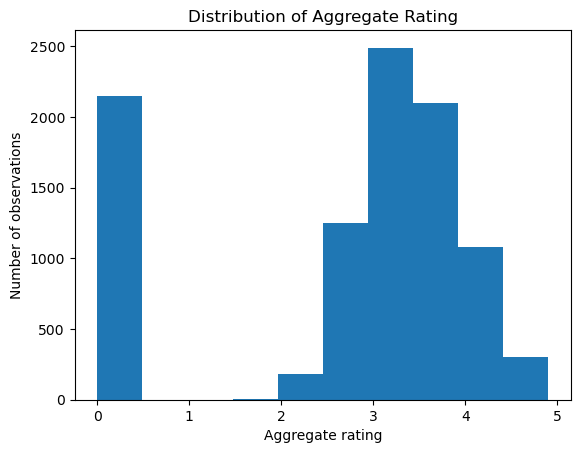

In [11]:
# Visualizing the distribution through histogram
plt.hist(target_variable)
plt.xlabel("Aggregate rating")
plt.ylabel("Number of observations")
plt.title("Distribution of Aggregate Rating")
plt.show()

#### From the graph, it is clear that there is no class imbalance present in the provided data.

# Level 1 Task 2: Descriptive Analysis

In [12]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


#### Performed descriptive analysis and calculated basic statistical measures like mean, median, standard deviation, etc for numerical columns.

In [13]:
# Exploring categorical variables
for col in df.select_dtypes(include=['object']):
  print(f"Distribution of {col}:")
  print(df[col].value_counts().sort_values(ascending=False).head(20))
  print("-"*20) # printing a horizontal line of 20 hyphens to the console

Distribution of Restaurant Name:
Restaurant Name
Cafe Coffee Day        83
Domino's Pizza         79
Subway                 63
Green Chick Chop       51
McDonald's             48
Keventers              34
Pizza Hut              30
Giani                  29
Baskin Robbins         28
Barbeque Nation        26
Dunkin' Donuts         22
Barista                22
Giani's                22
Costa Coffee           20
Pind Balluchi          20
Wah Ji Wah             19
Twenty Four Seven      19
Pizza Hut Delivery     19
Sagar Ratna            19
Republic of Chicken    18
Name: count, dtype: int64
--------------------
Distribution of City:
City
New Delhi                 5473
Gurgaon                   1118
Noida                     1080
Faridabad                  251
Ghaziabad                   25
Bhubaneshwar                21
Amritsar                    21
Ahmedabad                   21
Guwahati                    21
Lucknow                     21
Cape Town                   20
Bras�_lia       

In [18]:
print(df.columns)

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')


## Identify the top cuisines and cities with the highest number of restaurants..

In [14]:
# Grouping by cuisine and city, and counting the restaurants
restaurants_by_cuisine_city = df.groupby(['Cuisines', 'City']).size()

# Top cuisines along with the restaurant counts
top_cuisines = restaurants_by_cuisine_city.groupby('Cuisines').sum().sort_values(ascending=False)
print("Top Cuisines:")
print(top_cuisines.head(10))  # Show top 10 values

# Top cities along with the restaurant counts
top_cities = restaurants_by_cuisine_city.groupby('City').sum().sort_values(ascending=False)
print("\nTop Cities:")
print(top_cities.head(10))  # Showing top 10 values

Top Cuisines:
Cuisines
North Indian                      936
North Indian, Chinese             511
Fast Food                         354
Chinese                           354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
dtype: int64

Top Cities:
City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Lucknow           21
Amritsar          21
Ahmedabad         21
Guwahati          21
dtype: int64


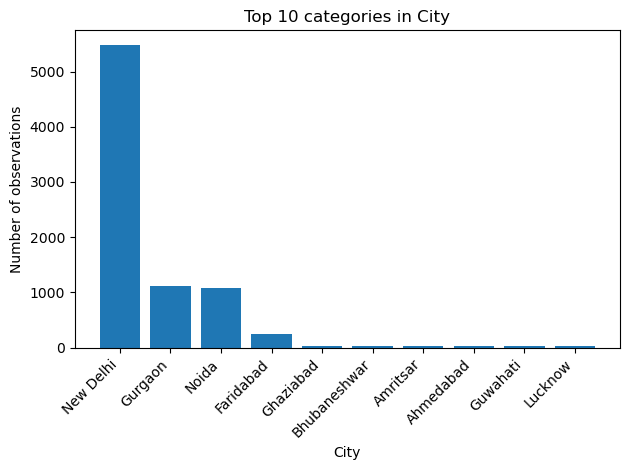

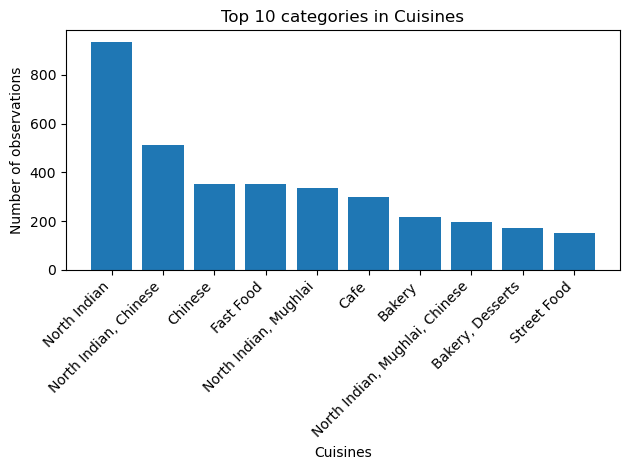

In [15]:
# Creating a function to visualize top 10 categories
def visualize_top_categories(column_name, df, top=10):
  
  value_counts = df[column_name].value_counts().sort_values(ascending=False)
  top_value_counts = value_counts.head(min(top, len(value_counts)))

  # Creating a bar chart
  plt.bar(top_value_counts.index, top_value_counts.values)
  plt.xlabel(column_name)
  plt.ylabel("Number of observations")
  plt.title(f"Top {top} categories in {column_name}")
  plt.xticks(rotation=45, ha="right")  # Rotating x-axis labels for readability
  plt.tight_layout()
  plt.show()

# Visualizing the distributions for both the columns
for col in ['City', 'Cuisines']:
  visualize_top_categories(col, df)

#### So, the North Indian is the top cuisine and New Delhi is the top city with highest number of restaurants.

# Level 1 Task 3: Geospatial Analysis

#### Folium bridges the gap between Python's data analysis capabilities and the world of interactive web maps. Folium empowers you to create informative and engaging maps in Python. This user-friendly library allows you to visualize geospatial data with ease. You can add markers, overlays, and other interactive elements to highlight patterns and trends within your data. Folium offers a variety of base map options, from OpenStreetMap to custom tile sets, and provides customization tools to tailor the map's appearance to your needs. The resulting maps can be exported as HTML files for sharing or embedded directly within Jupyter Notebooks, making Folium a valuable asset for data exploration and communication.

In [16]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [17]:
pip install --upgrade folium

Note: you may need to restart the kernel to use updated packages.


In [18]:
import folium as fl

In [19]:
# Creating a map centered around the mean of latitude and longitude
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
mymap = fl.Map(location=map_center, zoom_start=10)

# Adding title to the map
title_html = '''
             <h3 align="center" style="font-size:20px"><b>Restaurant Locations</b></h3>
             '''
mymap.get_root().html.add_child(fl.Element(title_html))

# Adding markers for each restaurant
for index, row in df.iterrows():
  restaurant_name = row['Restaurant Name']
  latitude = row['Latitude']
  longitude = row['Longitude']
  popup_text = f"Name: {restaurant_name}<br> Address: {row['Address']}"

  # Adding the marker with popup
  fl.Marker([latitude, longitude], popup=popup_text).add_to(mymap)

mymap


### Analyzing the distribution of restaurants across different cities or countries.

In [27]:
print(df.columns)

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')


In [20]:
# Group by 'City' for city-wise analysis
city_groups = df.groupby('City')

In [21]:
# Getting the count of restaurants in each city
city_restaurant_counts = city_groups.size().head(10).sort_values(ascending=False)

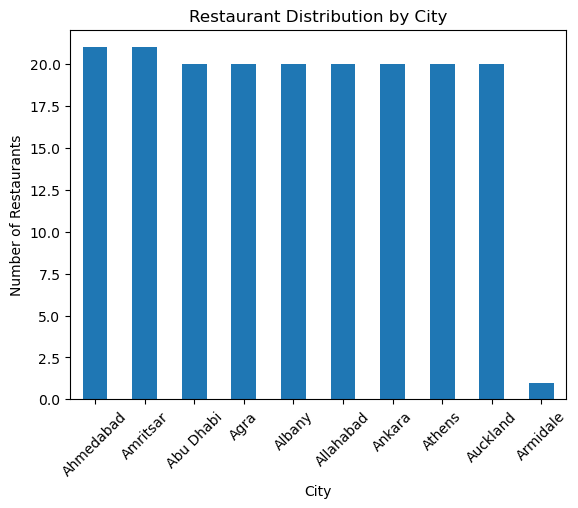

In [22]:
city_restaurant_counts.plot(kind='bar')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.title('Restaurant Distribution by City')
plt.xticks(rotation=45)
plt.show()

#### Ahmedabad and Amritsar are the cities who has the highest number of restaurants.

### Determine if there is any correlation between the restaurant's location and its rating

In [23]:
# Calculate the correlation between Longitude/Latitude and Aggregate rating
correlation = df[['Longitude', 'Latitude', 'Aggregate rating']].corr()
print("\nCorrelation between Longitude/Latitude and Aggregate rating:")
print(correlation)


Correlation between Longitude/Latitude and Aggregate rating:
                  Longitude  Latitude  Aggregate rating
Longitude          1.000000  0.043207         -0.116818
Latitude           0.043207  1.000000          0.000516
Aggregate rating  -0.116818  0.000516          1.000000


#### As per the above output, 
- Correlation between Longitude and Aggregate Rating: This value, -0.116818, is a weak negative correlation. However, the value is very close to zero, so the effect is minimal.- 
Correlation between Latitude and Aggregate Rating: This value, 0.000516, is extremely close to zero. It signifies essentially no  correlation between latitude and aggregate ratingeak.

#### In simpler terms, based on this data, there's:
- No significant relationship between a restaurant's location (longitude or latitude) and its average rating.
- A very slight tendency for restaurants at higher longitudes to have slightly lower ratings, but this effect is very weak.